# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything-2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `segment-anything-2` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything-2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [1]:
gpu_info = !nvidia-smi
gpu_info = "\n".join(gpu_info)
if gpu_info.find("failed") >= 0:
    print("Not connected to a GPU")
else:
    print(gpu_info)

Wed Sep 10 17:10:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.133.07             Driver Version: 570.133.07     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A4500               Off |   00000000:17:00.0 Off |                  Off |
| 30%   29C    P8              9W /  200W |      18MiB /  20470MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Set-up

In [2]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [3]:
# use bfloat16 for the entire notebook
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

### Loading the SAM 2 video predictor

In [4]:
from sam2.build_sam import build_sam2_video_predictor

print(os.getcwd())

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "/configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint)

/home/allyndree/sam2_test/notebooks


In [5]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(
        plt.Rectangle((x0, y0), w, h, edgecolor="green", facecolor=(0, 0, 0, 0), lw=2)
    )

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

To select every other frames :
```
ffmpeg -i <your_video>.mp4 -vf "select='not(mod(n,2))'" -q:v 2 -vsync 0 -start_number 0 <output_dir>/'%05d.jpg'
```

# Adding a frame start

In [6]:
predictor.reset_state(inference_state)

NameError: name 'inference_state' is not defined

In [7]:
frame_start = 0

/home/allyndree/sam2_test/notebooks
['00000.jpg', '00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg', '00005.jpg', '00006.jpg', '00007.jpg', '00008.jpg', '00009.jpg', '00010.jpg', '00011.jpg', '00012.jpg', '00013.jpg', '00014.jpg', '00015.jpg', '00016.jpg', '00017.jpg', '00018.jpg', '00019.jpg', '00020.jpg', '00021.jpg', '00022.jpg', '00023.jpg', '00024.jpg', '00025.jpg', '00026.jpg', '00027.jpg', '00028.jpg', '00029.jpg', '00030.jpg', '00031.jpg', '00032.jpg', '00033.jpg', '00034.jpg', '00035.jpg', '00036.jpg', '00037.jpg', '00038.jpg', '00039.jpg', '00040.jpg', '00041.jpg', '00042.jpg', '00043.jpg', '00044.jpg', '00045.jpg', '00046.jpg', '00047.jpg', '00048.jpg', '00049.jpg', '00050.jpg', '00051.jpg', '00052.jpg', '00053.jpg', '00054.jpg', '00055.jpg', '00056.jpg', '00057.jpg', '00058.jpg', '00059.jpg', '00060.jpg', '00061.jpg', '00062.jpg', '00063.jpg', '00064.jpg', '00065.jpg', '00066.jpg', '00067.jpg', '00068.jpg', '00069.jpg', '00070.jpg', '00071.jpg', '00072.jpg', '00073.jpg', '

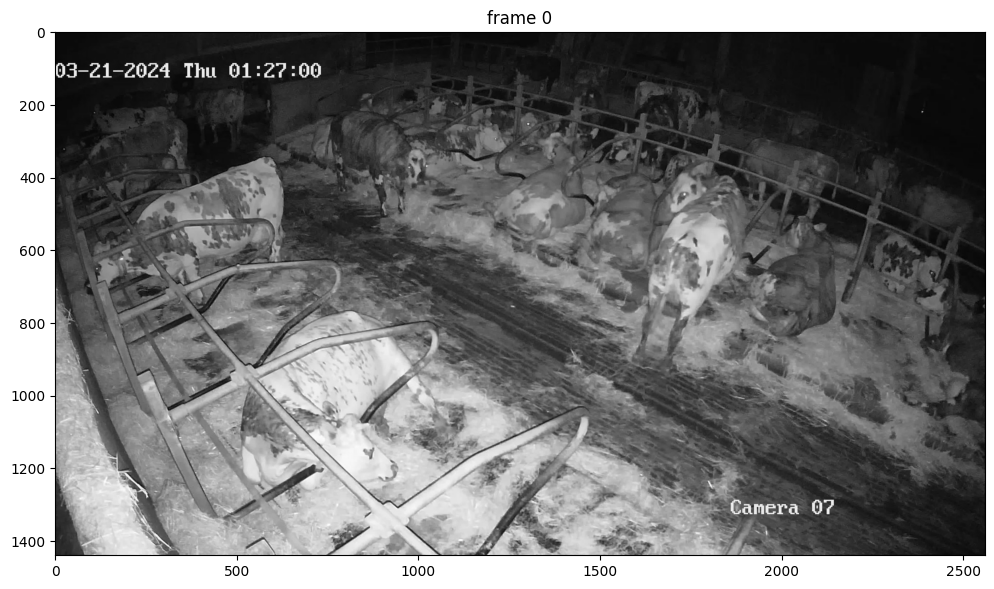

In [8]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
# video_dir = "./videos/bedroom"
print(os.getcwd())
video_dir = "videos/frames_202403210100_D05_cut5_1fps/"

# scan all the JPEG frame names in this directory
frame_names = [
    p
    for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]

frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))
print(frame_names)
# take a look the first video frame
frame_idx = frame_start
plt.figure(figsize=(12, 8))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

# Getting the first annotations in the correct format

In [9]:
def convert_normalized_to_pixels(normalized_box, img_width=2560, img_height=1440):
    """
    Convert normalized YOLO format [class_id, x_center, y_center, width, height] to
    pixel coordinates [x1, y1, x2, y2]

    Parameters:
    normalized_box (str): Space-separated string with format "class_id x_center y_center width height"
    img_width (int): Width of the image in pixels
    img_height (int): Height of the image in pixels

    Returns:
    list: Pixel coordinates [x1, y1, x2, y2]
    """

    all_bounding_boxes = []

    for box in normalized_box.split("\n"):
        values = box.split()
        class_id = int(values[0])
        x_center = float(values[1])
        y_center = float(values[2])
        width = float(values[3])
        height = float(values[4])

        # Convert center coordinates to absolute pixels
        x_center_px = x_center * img_width
        y_center_px = y_center * img_height

        # Convert width/height to absolute pixels
        width_px = width * img_width
        height_px = height * img_height

        # Calculate corner coordinates
        x1 = x_center_px - (width_px / 2)
        y1 = y_center_px - (height_px / 2)
        x2 = x_center_px + (width_px / 2)
        y2 = y_center_px + (height_px / 2)

        all_bounding_boxes.append([x1, y1, x2, y2])

    return all_bounding_boxes


# Example using your data as a string
normalized_box_str = """1 0.14062499999999997 0.39129044792991385 0.2189732142857142 0.30758089585982773
    2 0.34402901785714285 0.2625 0.11350446428571427 0.2321428571428571
    3 0.5143500813057096 0.09639695254155617 0.07427276559865092 0.10863346181642963
    4 0.6826801517067003 0.45399634780165754 0.12895069532237624 0.38432364096080884
    5 0.07016434892541097 0.19441288033566656 0.14032869785082194 0.11462994665251108
    6 0.7759125639839426 0.4714145245118699 0.1308550237388152 0.24610198061525504"""
pixel_box = convert_normalized_to_pixels(normalized_box_str)

print(pixel_box)


[[79.71428571428578, 342.0, 640.2857142857141, 784.916490038152], [735.4285714285713, 210.8571428571429, 1026.0, 545.1428571428571], [1221.6670681763433, 60.59551915201155, 1411.8053481088898, 217.0277041676702], [1582.604298356511, 377.04171934260455, 1912.7180783817942, 930.4677623261692], [0.0, 197.4209860935519, 359.24146649810416, 362.4881092731678], [1818.8417334132096, 501.64348925410906, 2153.8305941845765, 856.0303413400763]]


#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

In [10]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 301/301 [00:16<00:00, 17.86it/s]


#### Step 1: Add two objects on a frame

In [11]:
predictor.reset_state(inference_state)

SAM 2 can also segment and track two or more objects at the same time. One way, of course, is to do them one by one. However, it would be more efficient to batch them together (e.g. so that we can share the image features between objects to reduce computation costs).

This time, let's focus on object parts and segment **the shirts of both childen** in this video. Here we add prompts for these two objects and assign each of them a unique object id.

In [12]:
prompts = {}  # hold all the clicks we add for visualization

## Show the object to annotate

/home/allyndree/sam2_test/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/home/allyndree/sam2_test/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


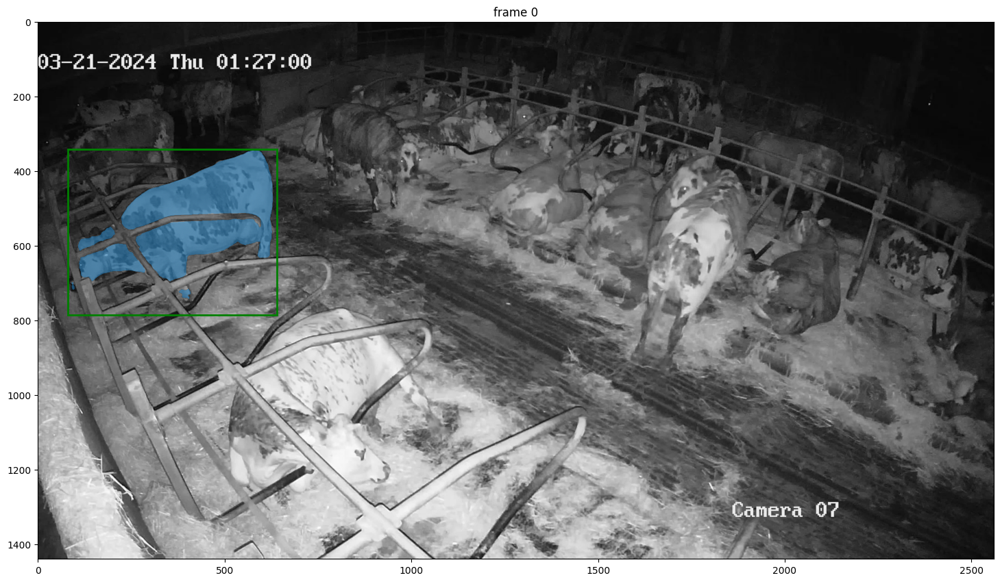

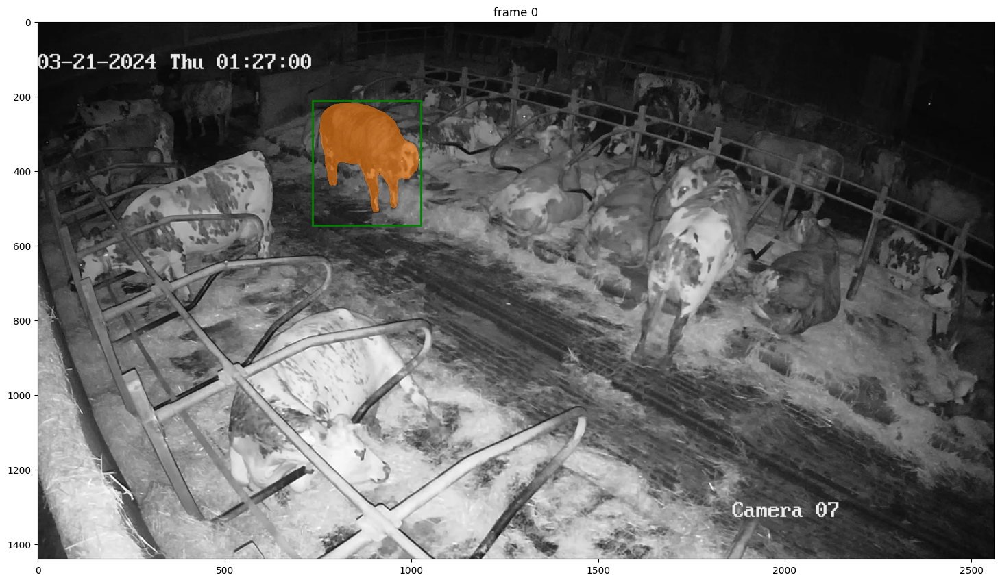

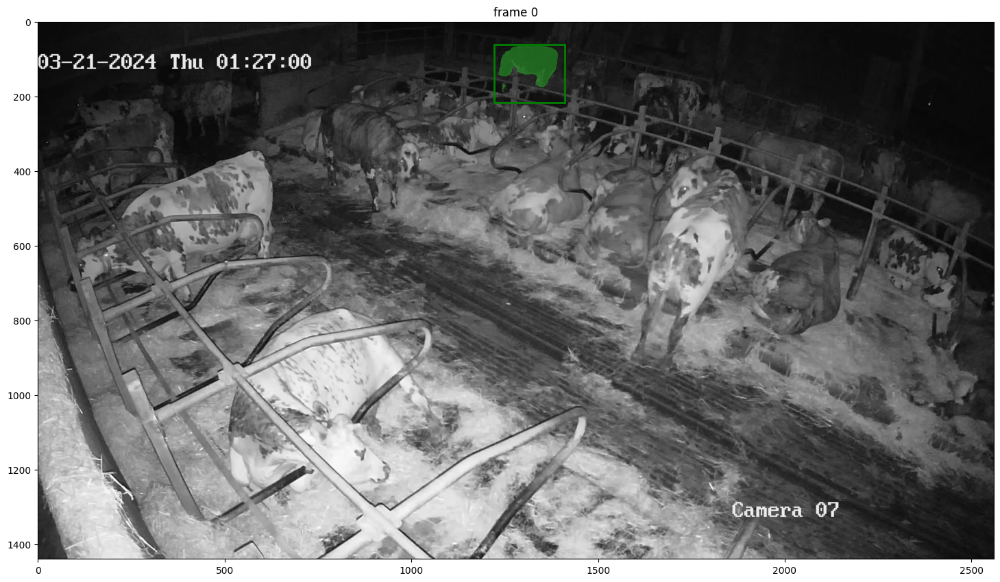

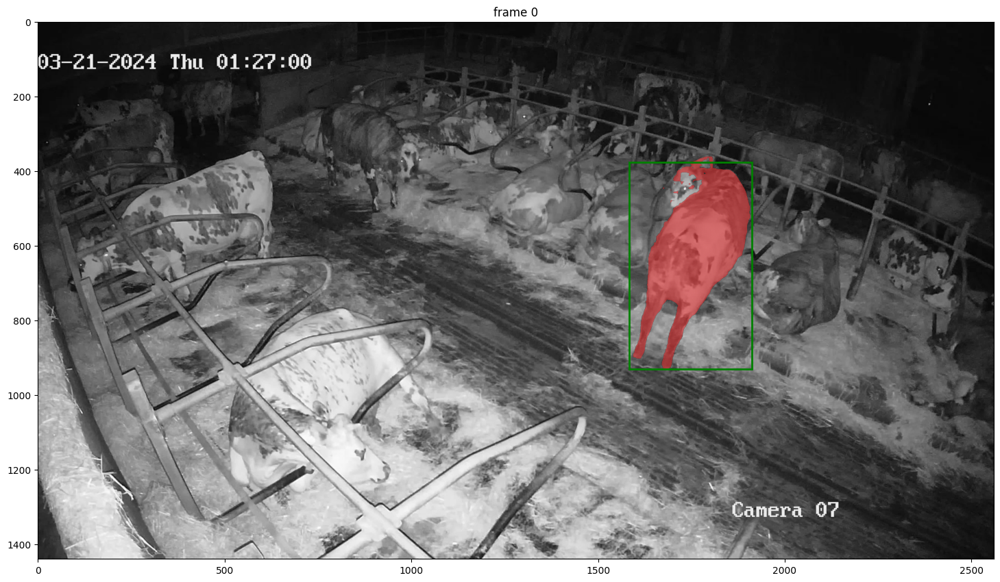

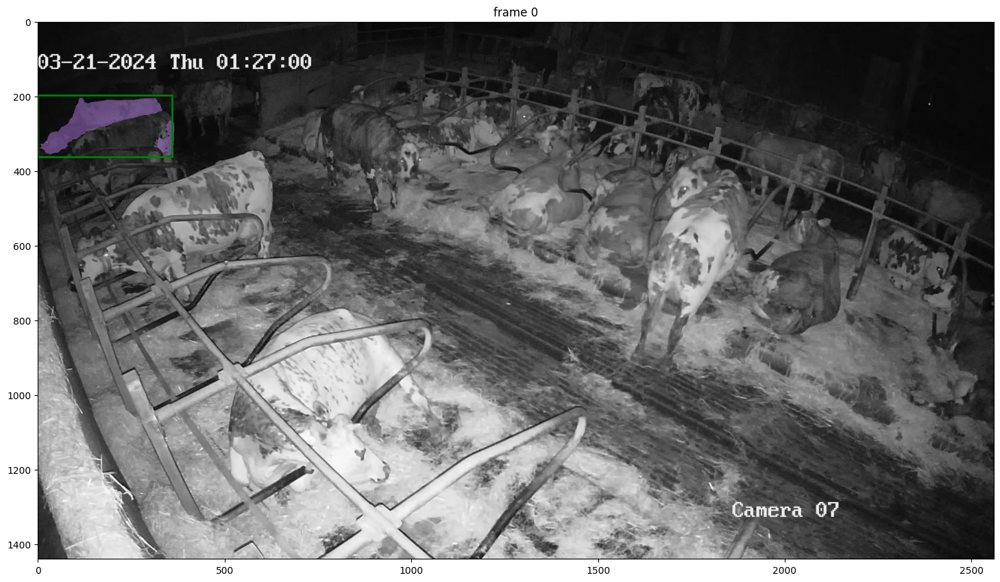

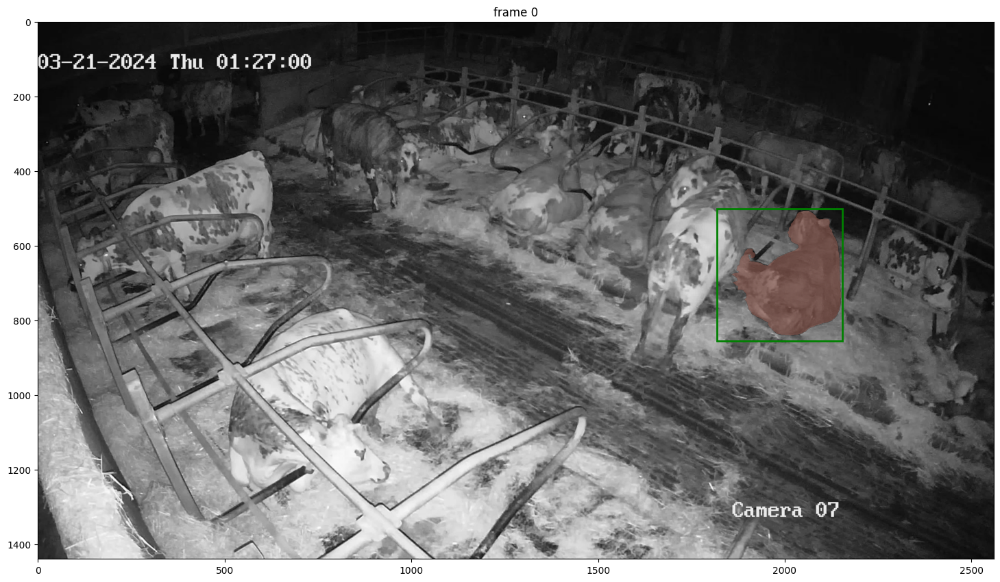

In [13]:
for object_to_annotate in [0, 1, 2, 3, 4, 5]:
    ann_frame_idx = 0  # the frame index we interact with
    ann_obj_id = object_to_annotate  # give a unique id to each object we interact with (it can be any integers)

    # Let's add a box at (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) to get started
    all_boxes = np.array(
        pixel_box,
        dtype=np.float32,
    )

    box = all_boxes[object_to_annotate]
    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        box=box,
    )
    labels = np.array([0, 1, 2, 3, 4, 5], np.int32)

    # show the results on the current (interacted) frame
    plt.figure(figsize=(18, 12))
    plt.title(f"frame {ann_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
    show_box(box, plt.gca())
    show_mask(
        (out_mask_logits[object_to_annotate] > 0.0).cpu().numpy(),
        plt.gca(),
        obj_id=out_obj_ids[object_to_annotate],
    )

    prompts[ann_obj_id] = box, labels

#### Step 2: Propagate the prompts to get masklets across the video

Now, we propagate the prompts for both objects to get their masklets throughout the video.

Note: when there are multiple objects, the `propagate_in_video` API will return a list of masks for each object.

In [14]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(
    inference_state
):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video:  69%|██████▉   | 207/301 [00:38<00:17,  5.30it/s]

propagate in video: 100%|██████████| 301/301 [00:56<00:00,  5.35it/s]


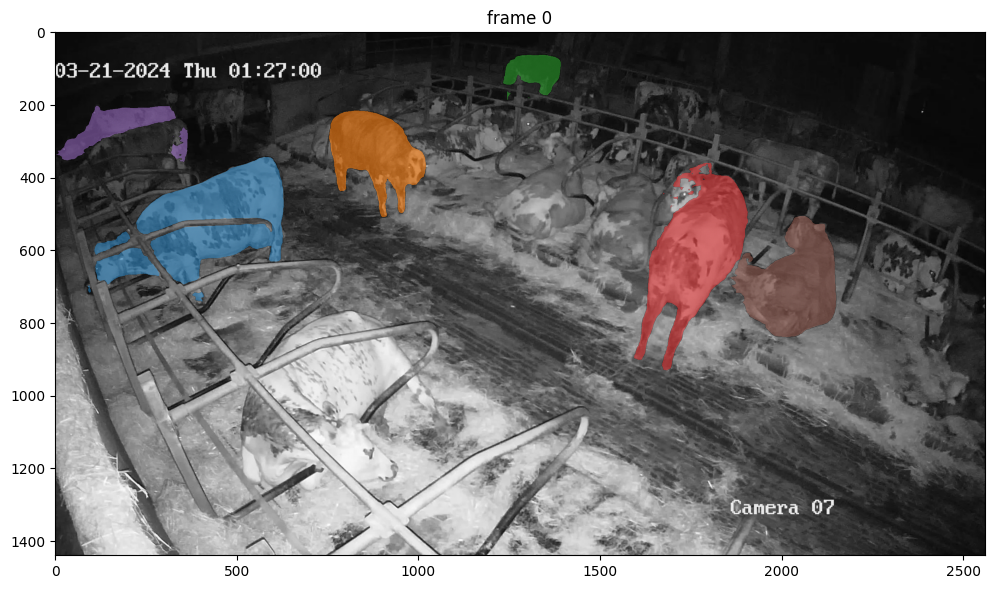

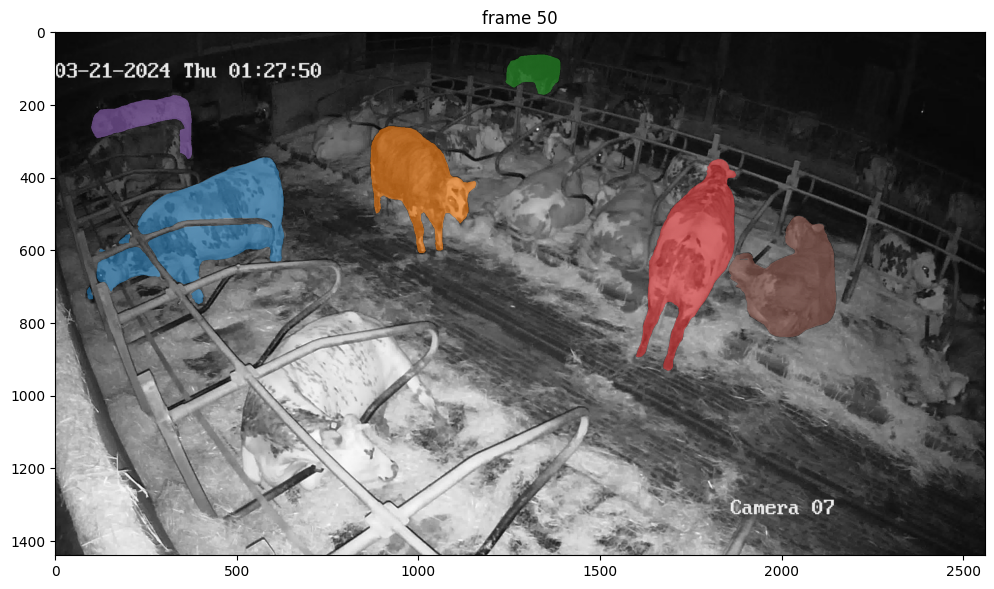

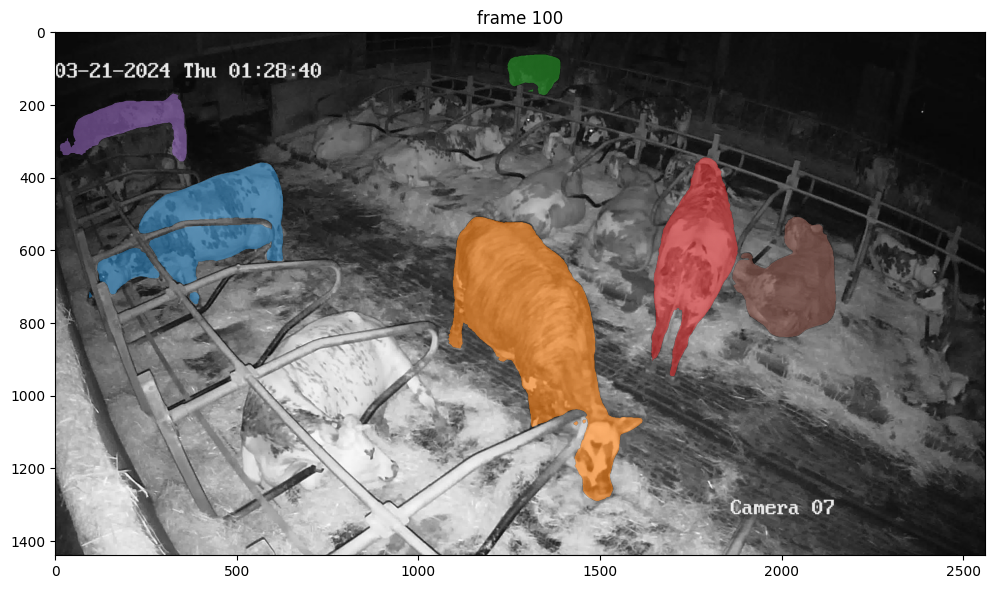

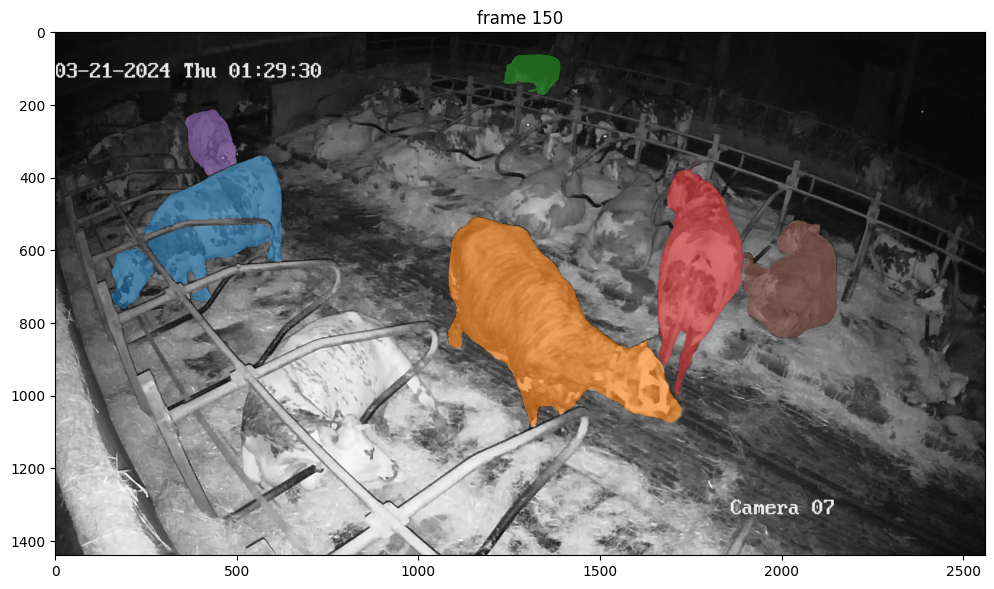

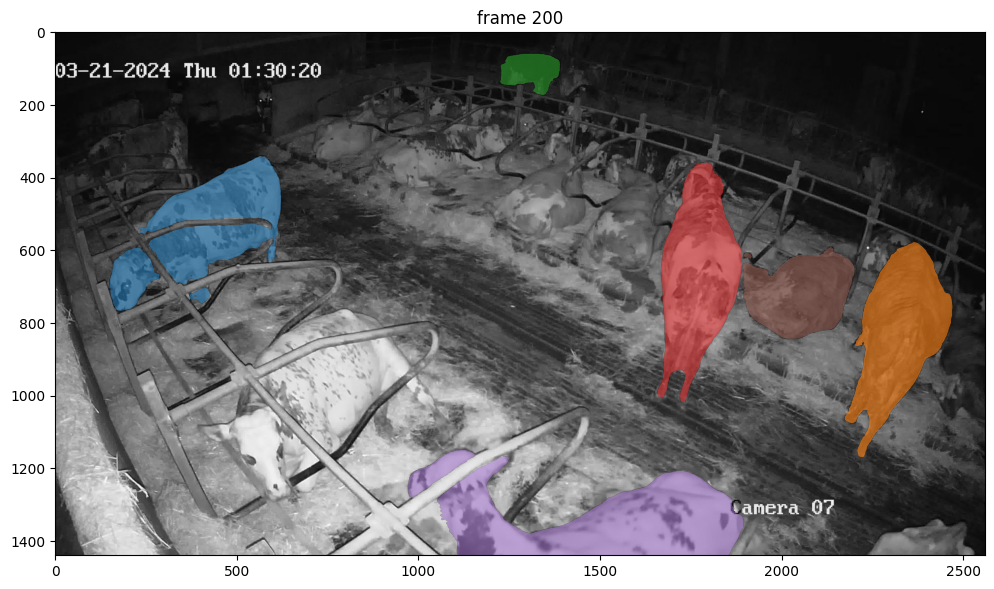

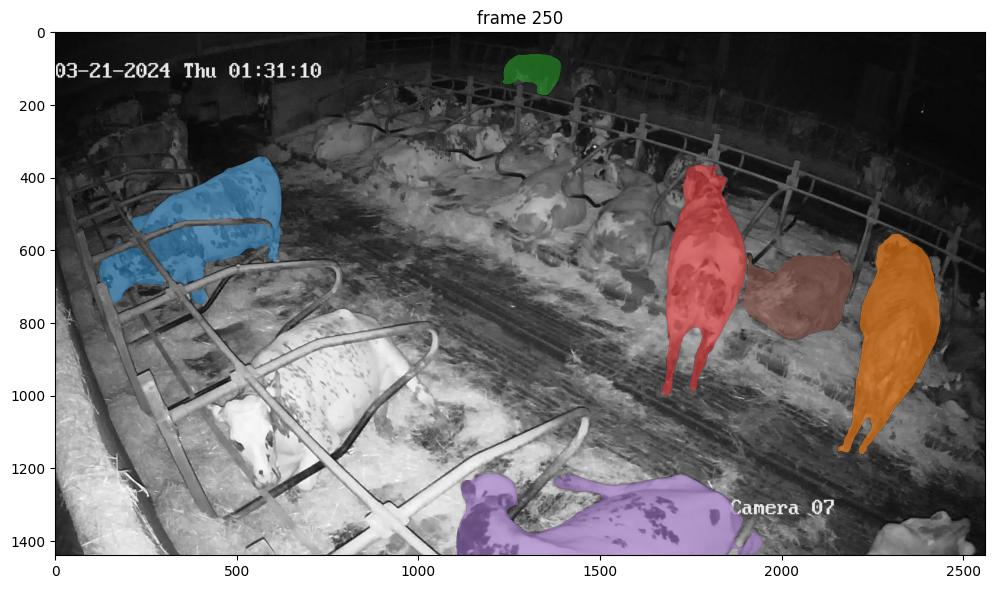

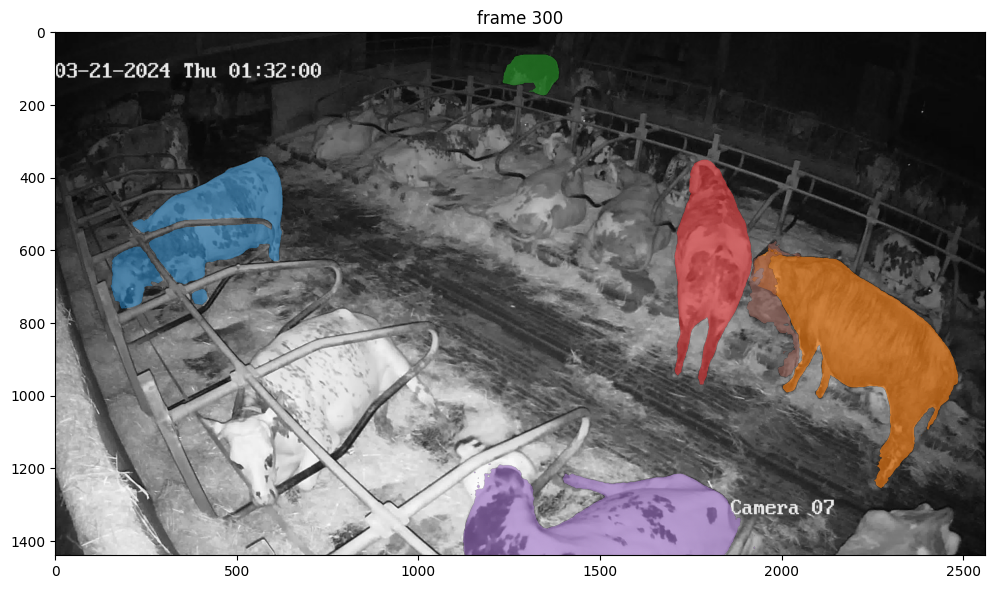

In [15]:
# render the segmentation results every few frames
vis_frame_stride = 50
plt.close("all")
for out_frame_idx in range(frame_start, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(12, 8))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

# Exporting the results

In [16]:
def mask_to_bbox(mask):
    """Convert a binary mask to a bounding box [x1, y1, x2, y2]"""
    # Find coordinates of non-zero elements (the mask)
    rows = np.any(mask[0], axis=1)
    cols = np.any(mask[0], axis=0)

    if not np.any(rows) or not np.any(cols):
        return None  # Return empty bbox for empty mask

    # Find min/max positions (bounding box corners)
    y_min, y_max = np.where(rows)[0][[0, -1]]
    x_min, x_max = np.where(cols)[0][[0, -1]]

    return [int(x_min), int(y_min), int(x_max), int(y_max)]


In [17]:
# frame,track_id,x1,y1,x2,y2,confidence,class,class_name
bboxes = []

for frame_idx, segment in video_segments.items():
    for instance_idx, instance in segment.items():
        # Assuming instance contains a mask in the first position
        # Adjust the following line based on the actual structure
        mask = instance

        if isinstance(mask, np.ndarray) and mask.ndim >= 2:
            bbox = mask_to_bbox(mask)
            if bbox is None:
                continue

            segment_bboxes = {
                "frame": frame_idx,
                "track_id": instance_idx,
                "x1": bbox[0],
                "y1": bbox[1],
                "x2": bbox[2],
                "y2": bbox[3],
                "confidence": 1.0,
                "class": 19,
                "class_name": "cow",
            }
            bboxes.append(segment_bboxes)
    #     break
    # break

print(bboxes[0])

{'frame': 0, 'track_id': 0, 'x1': 89, 'y1': 346, 'x2': 629, 'y2': 744, 'confidence': 1.0, 'class': 19, 'class_name': 'cow'}


In [18]:
# export everything into a CSV file
import pandas as pd

df_SAM2_results = pd.DataFrame(bboxes)
display(df_SAM2_results)


,frame,track_id,x1,y1,x2,y2,confidence,class,class_name
0,0,0,89,346,629,744,1.0,19,cow
1,0,1,754,218,1021,511,1.0,19,cow
2,0,2,1233,65,1392,188,1.0,19,cow
3,0,3,1593,362,1907,932,1.0,19,cow
4,0,4,0,204,365,360,1.0,19,cow
...,...,...,...,...,...,...,...,...,...
1801,300,1,1918,593,2486,1256,1.0,19,cow
1802,300,2,1231,64,1387,177,1.0,19,cow
1803,300,3,1705,353,1918,971,1.0,19,cow
1804,300,4,1123,1184,1926,1439,1.0,19,cow


In [20]:
path_export = "/home/allyndree/sam2_test/RESULTS"
name_file = "ANN2_SAM2_results_1fps.csv"
df_SAM2_results.to_csv(os.path.join(path_export, name_file), index=False)
print(f"Exported results to {os.path.join(path_export, name_file)}")

Exported results to /home/allyndree/sam2_test/RESULTS/ANN2_SAM2_results_1fps.csv
